# Deep Learning Project2B - Part C (GAN)
## Abdul Wahab Akram - 18L-1845

## Major Imports

In [0]:
from __future__ import print_function, division

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as pltQ 
import sys
import numpy as np
import os
import cv2
from PIL import Image

## Preprocessing Function

In [0]:
train_data = []
im_width = 28
im_height = 28

def preProcessTrainData(path):
    image_files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path,f))]
    
    for file_name in image_files:
        image_file = str(path + file_name)
        img = cv2.imread(image_file,cv2.IMREAD_COLOR)
        new_img = cv2.resize(img,(im_width,im_height))
        train_data.append(new_img)
        return train_data


## Create GAN

In [0]:
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100
        self.train_data = []

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        
    def preProcessTrainData(path):
      image_files = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path,f))]
      for file_name in image_files:
        image_file = str(path + file_name)
        img = cv2.imread(image_file,cv2.IMREAD_COLOR)
        new_img = cv2.resize(img,(im_width,im_height))
        train_data.append(new_img)
    


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        X_train =  preProcessTrainData(os.getcwd()+'/1/')
        X_train = np.array(X_train)
        X_train = X_train.reshape((X_train.shape)[0],(X_train.shape)[1],(X_train.shape)[2],3)

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        if(epoch == 30000):
          #fig.savefig("images/%d.png" % epoch)
          return plt
          

## Results:

## We can see generated images at last of the output cell, I have kept image size of 28x28 becasue of "ResourceExausted" error on larger image size

## Note: I have applied GAN just on 1st type of skin disease from Derm Dataset, however this can be used to generate images of any of the other 6 classes.

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 2352)              0         
_________________________________________________________________
dense_50 (Dense)             (None, 512)               1204736   
_________________________________________________________________
leaky_re_lu_36 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_51 (Dense)             (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_37 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_52 (Dense)             (None, 1)                 257       
Total params: 1,336,321
Trainable params: 1,336,321
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.628357, acc.: 54.69%] [G loss: 0.643510]
1 [D loss: 0.396672, acc.: 75.00%] [G loss: 0.722910]
2 [D loss: 0.282485, acc.: 85.94%] [G loss: 0.962173]
3 [D loss: 0.281151, acc.: 84.38%] [G loss: 1.085221]
4 [D loss: 0.228416, acc.: 92.19%] [G loss: 1.199489]
5 [D loss: 0.163765, acc.: 100.00%] [G loss: 1.426952]
6 [D loss: 0.174122, acc.: 96.88%] [G loss: 1.427720]
7 [D loss: 0.143705, acc.: 98.44%] [G loss: 1.621335]
8 [D loss: 0.121824, acc.: 100.00%] [G loss: 1.750630]
9 [D loss: 0.115523, acc.: 100.00%] [G loss: 1.899463]
10 [D loss: 0.083045, acc.: 100.00%] [G loss: 1.876197]
11 [D loss: 0.103431, acc.: 100.00%] [G loss: 1.957072]
12 [D loss: 0.095878, acc.: 100.00%] [G loss: 1.943967]
13 [D loss: 0.085608, acc.: 100.00%] [G loss: 2.170074]
14 [D loss: 0.086241, acc.: 100.00%] [G loss: 2.351712]
15 [D loss: 0.071525, acc.: 100.00%] [G loss: 2.364179]
16 [D loss: 0.076867, acc.: 100.00%] [G loss: 2.492056]
17 [D loss: 0.065871, acc.: 100.00%] [G loss: 2.541505]
18 [D los

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


4001 [D loss: 0.262426, acc.: 87.50%] [G loss: 3.997498]
4002 [D loss: 0.329018, acc.: 87.50%] [G loss: 3.562629]
4003 [D loss: 0.386577, acc.: 84.38%] [G loss: 4.213116]
4004 [D loss: 0.925374, acc.: 34.38%] [G loss: 5.020694]
4005 [D loss: 1.937333, acc.: 12.50%] [G loss: 1.615689]
4006 [D loss: 0.555146, acc.: 70.31%] [G loss: 2.870991]
4007 [D loss: 1.189650, acc.: 17.19%] [G loss: 2.538602]
4008 [D loss: 0.443374, acc.: 81.25%] [G loss: 2.712306]
4009 [D loss: 0.950854, acc.: 15.62%] [G loss: 1.787437]
4010 [D loss: 0.275171, acc.: 90.62%] [G loss: 3.757844]
4011 [D loss: 0.784876, acc.: 25.00%] [G loss: 1.672292]
4012 [D loss: 0.466191, acc.: 75.00%] [G loss: 3.137445]
4013 [D loss: 0.498794, acc.: 89.06%] [G loss: 2.690824]
4014 [D loss: 0.412995, acc.: 84.38%] [G loss: 3.546488]
4015 [D loss: 0.346314, acc.: 93.75%] [G loss: 3.446970]
4016 [D loss: 0.365289, acc.: 85.94%] [G loss: 3.599293]
4017 [D loss: 0.435833, acc.: 90.62%] [G loss: 3.485343]
4018 [D loss: 0.412188, acc.: 8

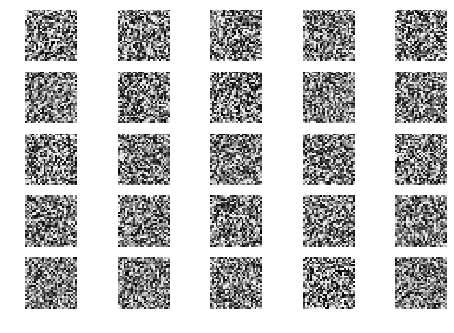

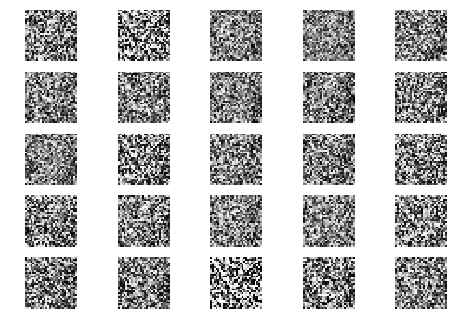

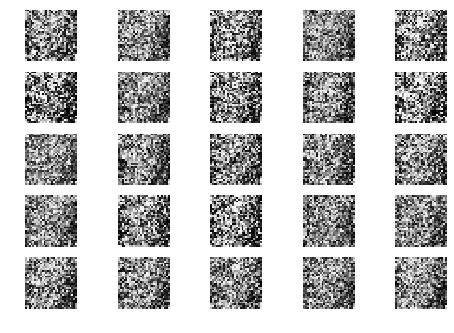

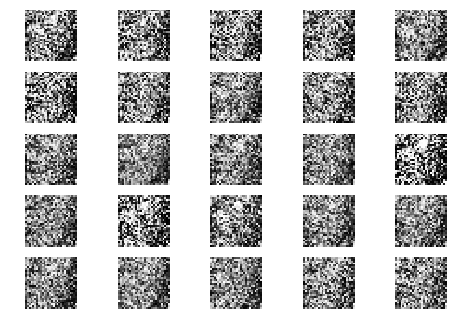

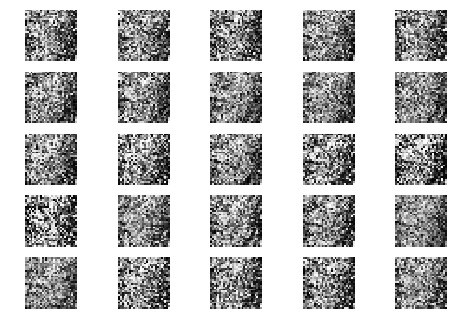

...

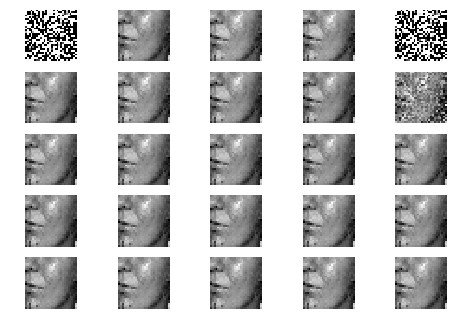

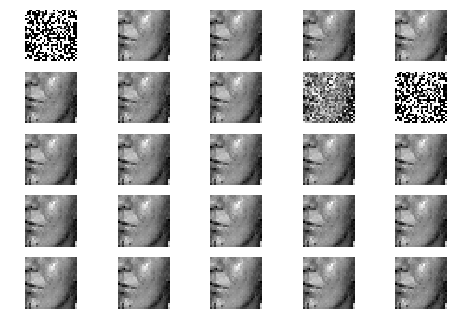

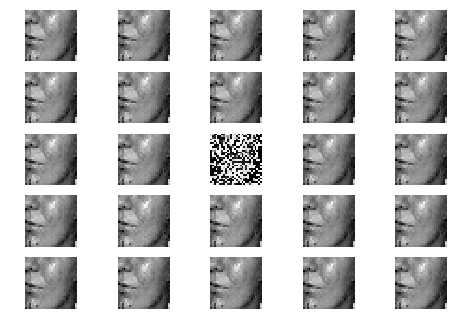

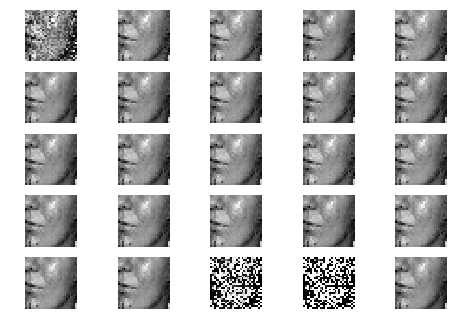

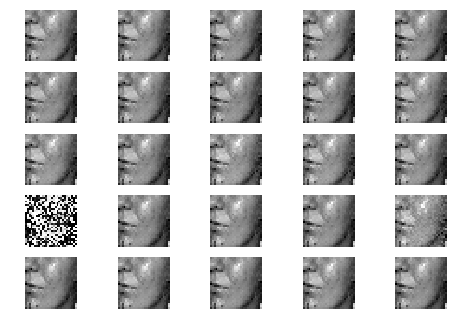

In [24]:
if __name__ == '__main__':
    gan = GAN()
plt=gan.train(epochs=30000, batch_size=32, sample_interval=200)